In [3]:
%load_ext autoreload
%autoreload 2
from dpe import DPE
from lib_data import *
import matplotlib.pyplot as plt
import numpy as np
from lib_nn_dpe import NN_dpe
from IPython import display

import serial
%config InlineBackend.figure_formats = ['svg']

import matplotlib
matplotlib.rcParams['font.sans-serif'] = "Arial"

In [4]:
dpe = DPE('COM3')
dpe.set_clock(50)
dpe.shape

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default
Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


[64, 64]

In [7]:
dpe2 = DPE('COM8')
dpe2.set_clock(50)
dpe2.shape

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default
Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


[64, 64]

....

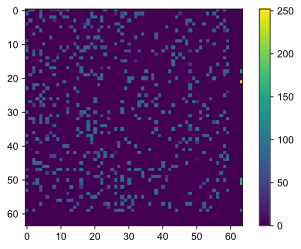

In [20]:
g = dpe2.read(2, Tdly=1000, method='slow')
plt.imshow(g * 1e6)
plt.colorbar()

In [27]:
dpe2 = DPE('COM3')
dpe2.set_clock(50)
dpe2.shape

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default
Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


[64, 64]

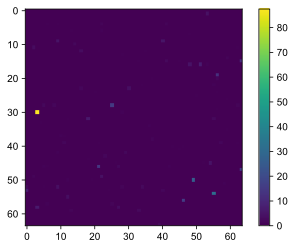

In [18]:
g = dpe.read(0, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

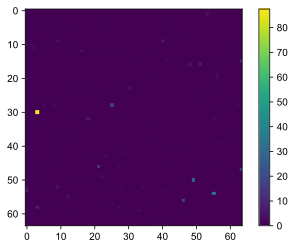

In [28]:
g = dpe2.read(0, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

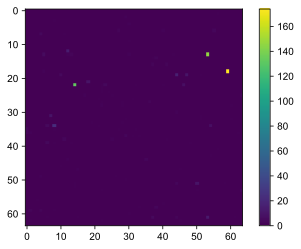

In [5]:
g = dpe.read(1, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

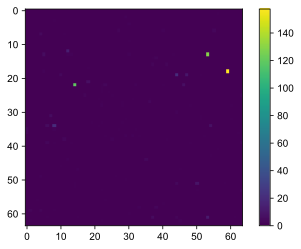

In [30]:
g = dpe2.read(1, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

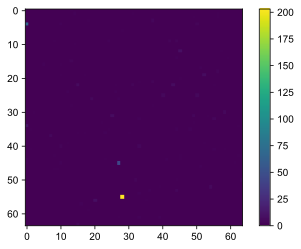

In [4]:
g = dpe.read(2, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

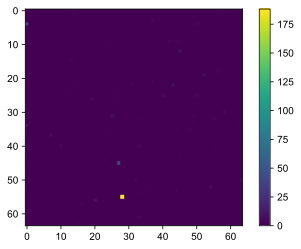

In [31]:
g = dpe2.read(2, Tdly=500, method='fast')
plt.imshow(g * 1e6)
plt.colorbar()

In [21]:
dpe = DPE('COM8')
dpe.set_clock(50)
dpe.shape

DAC initialized to a span from -10 V to 10 V
Setting vrefs to default
Setting ADC_CK freq=50000.0kHz
Setting CK_ARRAY freq=50000.0kHz


[64, 64]

..

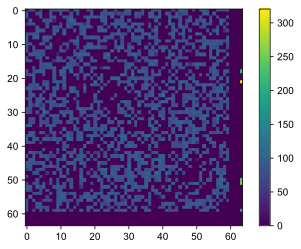

In [23]:
g = dpe.read(2, Tdly=500, method='slow')
plt.imshow(g * 1e6)
plt.colorbar()

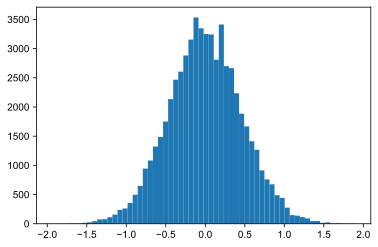

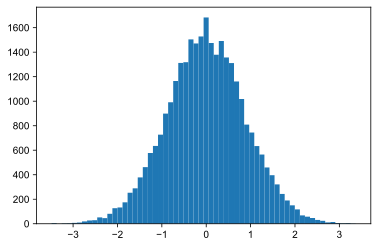

In [25]:
# NOW TRY TAKING THE DATA ONLY ONE COLUMN AT A TIME TO SEE IF WE GET BETTER ACCURACY
from lib_data import *
import scipy.io as sio
mat_contents = sio.loadmat('Exported60Node_GraphNum0.mat')
CMat = mat_contents['A']

CMat[0,33] = 0
CMat[33,0] = 0

import dut_func as dut
import time
import struct
import matplotlib
import matplotlib.pyplot as plt

from dpe import DPE
from lib_data import *
from lib_nn_dpe import NN_dpe
from IPython import display

arr = 2
dpe.N_BIT = 1

numTests = 500
appliedVector1 = np.zeros((64,numTests))
appliedVector2 = np.zeros((64,numTests))
randomVector = np.random.randint(2, size=(60,numTests))

appliedVector1[0:60,:] = randomVector[:,:]
appliedVector2[0:60,:] = 1-randomVector[:,:]
neuronVector = appliedVector1[0:60,:] - appliedVector2[0:60,:]

output1 = np.zeros((numTests,60))
output2 = np.zeros((numTests,60))
for c in range(60):
    #output1[:,c]  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[c,c+1], mode=1, debug=False, delay=5).T
    output1[:,c]  = dpe.multiply(arr, appliedVector1, c_sel=[c,c+1], mode=1, debug=False, Tdly=500).T
    #output2[:,c]  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[c,c+1], mode=1, debug=False, delay=5).T
    output2[:,c]  = dpe.multiply(arr, appliedVector2, c_sel=[c,c+1], mode=1, debug=False, Tdly=500).T
all_output = np.concatenate((output1, output2))

#SW_output = neuronVector * CMat
#SW_neuron = np.matmul(neuronVector, CMat)
SW_output1 = (CMat.T @ appliedVector1[0:60,:]).T 
SW_output2 = (CMat.T @ appliedVector2[0:60,:]).T 
all_SW_output = np.concatenate((SW_output1, SW_output2))

lin_corrs = []
for c in range(60):
    lin_corrs.append( np.polyfit(all_output[:,c], all_SW_output[:,c], 1))

output_corr  = dpe.lin_corr(all_output, lin_corrs)
output_corr1 = dpe.lin_corr(output1, lin_corrs)
output_corr2 = dpe.lin_corr(output2, lin_corrs)
exp_neuron_output = output_corr1 - output_corr2
SW_neuron_output = SW_output1 - SW_output2

error = output_corr - all_SW_output
fig, ax = plt.subplots()
for c in range(60):
    x = all_SW_output[:,c]
    y = output_corr[:,c]    
    ax.plot(x,y,'.')
zz = np.linspace(0,30,30)  
ax.plot(zz,zz,'-')

fig, ax = plt.subplots()
ax.hist(error.flatten(),bins=60);

fig, ax = plt.subplots()
for c in range(60):
    x = SW_neuron_output[:,c]
    y = exp_neuron_output[:,c]    
    ax.plot(x,y,'.')   
zz = np.linspace(-25,25,50)    
ax.plot(zz,zz,'-')  

fig, ax = plt.subplots()
err_neuron = exp_neuron_output.flatten() - SW_neuron_output.flatten()
ax.hist(err_neuron.flatten(),bins=60);

In [26]:
#Run the Hopfield network with different Schmidt width values, but all at the same starting neuron vector
#Compare the results to perfect Software version.
arr = 2
numCycles = 100
numTrials = 3

startSchmidtVals = [-4.0, -2.0, -0.2, 0, 0.2, -4.0]
endSchmidtVals   = [-4.0, -2.0, -0.2, 0, 0.2, +1.0]
numSchmidt = np.size(startSchmidtVals)

SchmidtCycleVector = np.zeros((numCycles,numSchmidt))

for ss in np.arange(numSchmidt):
    SchmidtCycleVector[:,ss] = np.linspace(startSchmidtVals[ss], endSchmidtVals[ss], numCycles)
    

threshold = 0
noise = 0
numCols = 60

#energyHistory = np.zeros((numCycles*numCols+1, numTrials))
appliedVector1 = np.zeros((64,numSchmidt))
appliedVector2 = np.zeros((64,numSchmidt))

neuronVectorHistory = np.zeros((60,numSchmidt, numCycles*numCols+1, numTrials))
rawColumnOutput1History = np.zeros((1,numSchmidt, numCycles*numCols+1, numTrials))
rawColumnOutput2History = np.zeros((1,numSchmidt, numCycles*numCols+1, numTrials))
columnOutputConvertedHistory =  np.zeros((1,numSchmidt, numCycles*numCols+1, numTrials))
neuronVector = np.zeros((60,numSchmidt))
columnUpdateHistory = np.zeros((1,numCycles*numCols+1, numTrials))

for tt in np.arange(numTrials):
    print('Trial number', tt)
    randomVector = np.random.randint(2, size=(60,1))
    initVector = randomVector

    for ss in np.arange(numSchmidt):
        appliedVector1[0:60,ss] = initVector[:,0]
        appliedVector2[0:60,ss] = 1-initVector[:,0]
        neuronVector[0:60,ss] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        neuronVectorHistory[:,ss,0,tt] = appliedVector1[0:60,ss] - appliedVector2[0:60,ss]
        
    #energyHistory[0,tt]= 0.5*np.dot(neuronVector.T, (CMat @ neuronVector))            

    for cc in np.arange(numCycles):
        randOrderColumns = np.arange(60)
        np.random.shuffle(randOrderColumns)
        
        trackCol=0
        for ii in randOrderColumns:
            
            output1  = dpe.multiply(arr, appliedVector1, c_sel=[ii,ii+1], mode=1, debug=False, Tdly=500).T
            output2  = dpe.multiply(arr, appliedVector2, c_sel=[ii,ii+1], mode=1, debug=False, Tdly=500).T            
            #output1  = dpe.multiply_w_delay(arr, appliedVector1, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            #output2  = dpe.multiply_w_delay(arr, appliedVector2, c_sel=[ii, ii+1], mode=1, debug=False, delay=5)
            
            output_corr = noise - dpe.lin_corr(output1, lin_corrs) + dpe.lin_corr(output2, lin_corrs)
            
            
            for ss in np.arange(numSchmidt):
                rawColumnOutput1History[0,ss,60*cc+trackCol+1,tt] = output1[0,ss]
                rawColumnOutput2History[0,ss,60*cc+trackCol+1,tt] = output2[0,ss]
                columnOutputConvertedHistory[0,ss,60*cc+trackCol+1,tt] = output_corr[0,ss]
                
                threshVector = threshold - SchmidtCycleVector[cc,ss]*neuronVector[ii,ss]
                #if (output_corr2[0,ii] >= threshVector[ii,0]):
                #if (output_corr >= threshVector[ii,0]):
                if (output_corr[0,ss] >= threshVector):
                    appliedVector1[ii,ss] = 1
                    appliedVector2[ii,ss] = 0
                    neuronVector[ii,ss] = 1
                else:
                    appliedVector1[ii,ss] = 0
                    appliedVector2[ii,ss] = 1
                    neuronVector[ii,ss] = -1
                neuronVectorHistory[:,ss,60*cc+trackCol+1,tt] = neuronVector[:,ss]
                
            columnUpdateHistory[0,60*cc+trackCol+1,tt] = ii                
            trackCol = trackCol + 1

save_workspace(vars(), note='Prober2_HNN_100cyc_3trial_VarSchmidt')

Trial number 0
Trial number 1
Trial number 2
Saving In(<class 'list'>), Out(<class 'dict'>), g(<class 'numpy.ndarray'>), mat_contents(<class 'dict'>), CMat(<class 'numpy.ndarray'>), arr(<class 'int'>), numTests(<class 'int'>), appliedVector1(<class 'numpy.ndarray'>), appliedVector2(<class 'numpy.ndarray'>), randomVector(<class 'numpy.ndarray'>), neuronVector(<class 'numpy.ndarray'>), output1(<class 'numpy.ndarray'>), output2(<class 'numpy.ndarray'>), c(<class 'int'>), all_output(<class 'numpy.ndarray'>), SW_output1(<class 'numpy.ndarray'>), SW_output2(<class 'numpy.ndarray'>), all_SW_output(<class 'numpy.ndarray'>), lin_corrs(<class 'list'>), output_corr(<class 'numpy.ndarray'>), output_corr1(<class 'numpy.ndarray'>), output_corr2(<class 'numpy.ndarray'>), exp_neuron_output(<class 'numpy.ndarray'>), SW_neuron_output(<class 'numpy.ndarray'>), error(<class 'numpy.ndarray'>), x(<class 'numpy.ndarray'>), y(<class 'numpy.ndarray'>), zz(<class 'numpy.ndarray'>), err_neuron(<class 'numpy.ndar